In [1]:
### from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)


Toggle code

In [2]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [3]:
pl.style.use('fabiostyle')
# needs to find the library of functions
sys.path.append('../../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [4]:
# %%javascript
# var nb = IPython.notebook;
# var kernel = IPython.notebook.kernel;
# var command = "NOTEBOOK_NAME = '" + nb.base_url + nb.notebook_path + "'";
# kernel.execute(command);

In [5]:
# NOTEBOOK_NAME = NOTEBOOK_NAME.split('/')[-1][:-6]
NOTEBOOK_NAME = 'decoder_weights_across_combined_0.5sec_vhpc'

In [6]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

Unable to restore variable 'load_all_animals_vars', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_distinct', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_distinct_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_within_LOO', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_within_LOO_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_with

In [7]:
from itertools import product
def load_all_animals_vars(varname, animal_list, pilot_list=None, notebook='preprocessing'):
    all_of_them = {}
    for ani in animal_list:
        folder = '../%s/notebooks/autorestore/%s/' % (ani, notebook)
        all_of_them.update({ani: ut.load_variable(varname, folder)})
    return all_of_them

In [8]:
#trying to use different trials for different time bins
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_distinct(patterns_t, labels_t, patterns_T, labels_T, n_cells=None, classes=None):
    if classes==None:
        classes=[0,1]
    which_train = {}
    which_test = {}
    for ani in patterns_t.keys():
        which_train_a = np.random.permutation(np.where(labels_t[ani]==0)[0])
        which_test_a = which_train_a[:len(which_train_a)/2]
        which_train_a = which_train_a[len(which_train_a)/2:]
        
        which_train_b = np.random.permutation(np.where(labels_t[ani]==1)[0])
        which_test_b = which_train_b[:len(which_train_b)/2]
        which_train_b = which_train_b[len(which_train_b)/2:]
        
        which_train[ani] = np.concatenate((which_train_a, which_train_b))
        which_test[ani] = np.concatenate((which_test_a, which_test_b))
    patterns_dt = patterns_t.copy()
    labels_dt = labels_t.copy()
    patterns_dT = patterns_T.copy()
    labels_dT = labels_T.copy()
    for ani in patterns_t.keys():
        patterns_dt[ani] = patterns_dt[ani][which_train[ani]]
        labels_dt[ani] = labels_dt[ani][which_train[ani]]
        patterns_dT[ani] = patterns_dT[ani][which_test[ani]]
        labels_dT[ani] = labels_dT[ani][which_test[ani]]      
        
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_dt, labels_dt)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_dT, labels_dT)
    
    if n_cells is None:
        cells = list(range(patterns_comb_train.shape[1]))
        print len(cells),
    elif n_cells > patterns_comb_train.shape[1]:
        cells = list(range(patterns_comb_train.shape[1]))
        #print len(cells),
    else:
        cells = np.random.choice(range(patterns_comb_train.shape[1]), size=n_cells, replace=False)
        #print cells.shape,
    
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [9]:
#trying to use different trials for different time bins
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_distinct_subset(patterns_t, labels_t, patterns_T, labels_T, cells, classes=[0,1]):
    which_train = {}
    which_test = {}
    for ani in patterns_t.keys():
        which_train_a = np.random.permutation(np.where(labels_t[ani]==0)[0])
        which_test_a = which_train_a[:len(which_train_a)/2]
        which_train_a = which_train_a[len(which_train_a)/2:]
        
        which_train_b = np.random.permutation(np.where(labels_t[ani]==1)[0])
        which_test_b = which_train_b[:len(which_train_b)/2]
        which_train_b = which_train_b[len(which_train_b)/2:]
        
        which_train[ani] = np.concatenate((which_train_a, which_train_b))
        which_test[ani] = np.concatenate((which_test_a, which_test_b))
    patterns_dt = patterns_t.copy()
    labels_dt = labels_t.copy()
    patterns_dT = patterns_T.copy()
    labels_dT = labels_T.copy()
    for ani in patterns_t.keys():
        patterns_dt[ani] = patterns_dt[ani][which_train[ani]]
        labels_dt[ani] = labels_dt[ani][which_train[ani]]
        patterns_dT[ani] = patterns_dT[ani][which_test[ani]]
        labels_dT[ani] = labels_dT[ani][which_test[ani]]      
        
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_dt, labels_dt)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_dT, labels_dT)
    
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [10]:
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross(patterns_t, labels_t, patterns_T, labels_T, n_cells=None, classes=None):
    if classes == None:
        classes = [0,1]
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)
    if n_cells is None:
        cells = list(range(patterns_comb_train.shape[1]))
        print len(cells),
    elif n_cells > patterns_comb_train.shape[1]:
        cells = list(range(patterns_comb_train.shape[1]))
        #print len(cells),
    else:
        cells = np.random.choice(range(patterns_comb_train.shape[1]), size=n_cells, replace=False)
        #print cells.shape,
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [11]:
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_subset(patterns_t, labels_t, patterns_T, labels_T, cells, classes=None):
    if classes == None:
        classes = [0,1]
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)

    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [12]:
from sklearn.model_selection import cross_val_score, LeaveOneOut
from sklearn.svm import SVC, LinearSVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_within_LOO(patterns, labels, n_cells=None, n_loops=10, n_jobs=1, cv=LeaveOneOut()):    
    patterns_comb, labels_comb = ut.combine_patterns(patterns, labels)
    if n_cells is None:
        cells = list(range(patterns_comb.shape[1]))
    else:
        cells = np.random.choice(range(patterns_comb.shape[1]), size=n_cells, replace=False)
    scores = []
    scores = cross_val_score(decoder, patterns_comb[:, cells], labels_comb, cv=cv, n_jobs=n_jobs)
    #scores_chance = []
    #for i in xrange(n_loops):
    #    scores_chance.append(cross_val_score(decoder, ps, np.random.permutation(ls), cv=cv, n_jobs=n_jobs))
    #scores_chance = np.r_[scores_chance].flatten()
    return scores#, scores_chance

In [13]:
from sklearn.model_selection import cross_val_score, LeaveOneOut
from sklearn.svm import SVC, LinearSVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_within_LOO_subset(patterns, labels, cells, n_loops=10, n_jobs=1, cv=LeaveOneOut()):    
    patterns_comb, labels_comb = ut.combine_patterns(patterns, labels)
    scores = []
    scores = cross_val_score(decoder, patterns_comb[:, cells], labels_comb, cv=cv, n_jobs=n_jobs)
    #scores_chance = []
    #for i in xrange(n_loops):
    #    scores_chance.append(cross_val_score(decoder, ps, np.random.permutation(ls), cv=cv, n_jobs=n_jobs))
    #scores_chance = np.r_[scores_chance].flatten()
    return scores#, scores_chance

In [14]:
#from sklearn.model_selection import KFold, LeaveOneOut
#from sklearn.svm import SVC
#
#def do_test_within_subset(patterns, labels, cells):
#   
#    which_train = {}
#    which_test = {}
#    for ani in patterns.keys():
#        which_train_a = np.random.permutation(np.where(labels[ani]==0)[0])
#        which_test_a = which_train_a[:len(which_train_a)/2]
#        which_train_a = which_train_a[len(which_train_a)/2:]
#        
#        which_train_b = np.random.permutation(np.where(labels[ani]==1)[0])
#        which_test_b = which_train_b[:len(which_train_b)/2]
#        which_train_b = which_train_b[len(which_train_b)/2:]
#        
#        which_train[ani] = np.concatenate((which_train_a, which_train_b))
#        which_test[ani] = np.concatenate((which_test_a, which_test_b))
#    
#    patterns_t = patterns.copy()
#    labels_t = labels.copy()
#    patterns_T = patterns.copy()
#    labels_T = labels.copy()
#    for ani in patterns.keys():
#        patterns_t[ani] = patterns[ani][which_train[ani]]
#        labels_t[ani] = labels[ani][which_train[ani]]
#        patterns_T[ani] = patterns[ani][which_test[ani]]
#        labels_T[ani] = labels[ani][which_test[ani]]
#    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
#    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)
#    
#    decoder.fit(patterns_comb_train[:, cells], labels_comb)
#    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
#    decoder.fit(patterns_comb_test[:, cells], labels_comb)
#    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [ ]:
#get weights for decoding within a single session
from sklearn.svm import SVC
def do_test_within_weights(patterns, labels):
    
    patterns_comb_weights, labels_comb_weights = ut.combine_patterns(patterns, labels)
    decoder.fit(patterns_comb_weights,labels_comb_weights)
    weights = decoder.coef_[0]
    return weights
#additionally, could train classifier on both sessions for comparison, then take avg of their weights

In [ ]:
decoder = SVC(kernel='linear', decision_function_shape='ovo')

In [ ]:
all_animals =     'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
pre_animals =     'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
post_animals =    'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
pre_rev_animals = 'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
post_rev_animals ='c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
catch_animals =   'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'

preVSpost_animals =       'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
preVSpre_rev_animals =    'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
preVSpost_rev_animals =   'c3f3',         'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91',       '93'
postVSpost_rev_animals =  'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
postVSpre_rev_animals =   'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
pre_revVSpost_rev_animals='c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
postVScatch_animals =     'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92', '93'
post_revVScatch_animals=  'c3f3', 'c3f2', 'c3m1', 'c3m2', 'c4m4', 'c10m6', 'c10m8', '90', '91', '92',

In [ ]:
sessions = 'pre', 'post', 'pre_rev', 'post_rev', 'catch'

In [ ]:
#delta_t0 = 0.5sec
#from referenced notebook, 28 time bins total beginning at 3s prior to odor onset and running through 10.5s post onset

#t_start0 = -3  # sec
#t_stop0 = 11  # sec
# CS BEGINS WITH TIME BIN 7 (tb6)
# TRACE BEGINS AT TB 11
# REWARD DELIVERED AT TB 15

In [ ]:
for sess in sessions:
    for dur in 5,: #use 5 for 0.5sec, 1 for 1 sec and 2 for 2sec
        exec("patterns_tb_%s = dict(zip(%s_animals, [ut.load_variable('patterns_tb_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(sess,sess,sess,dur,sess))
        exec("labels_%s = dict(zip(%s_animals, [ut.load_variable('labels_%s',\
                                                         '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(sess,sess,sess,sess))

In [ ]:
comparisons = 'preVSpost','preVSpre_rev','preVSpost_rev','postVSpre_rev','postVSpost_rev','pre_revVSpost_rev','postVScatch','post_revVScatch'

In [ ]:
#get cross-session patterns
for comp in comparisons:
    for dur in 5,:
        exec("%s__patterns__%s = dict(zip(%s_animals, [ut.load_variable('%s_patterns_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(comp,comp.split('VS')[0],comp,
                                                    comp,comp.split('VS')[0],dur,comp))
        exec("%s__patterns__%s = dict(zip(%s_animals, [ut.load_variable('%s_patterns_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(comp,comp.split('VS')[1],comp,
                                                    comp,comp.split('VS')[1],dur,comp))

In [ ]:
relabel_rwVSsh = {0:-1,1:1,2:0}
relabel_rwVScsm = {0:0,1:1,2:-1}
relabel_shVScsm = {0:0,1:-1,2:1}
for sess in sessions:
    exec("labels_rwVSsh_%s = {}"%sess)
    exec("labels_rwVScsm_%s = {}"%sess)
    exec("labels_shVScsm_%s = {}"%sess)
    for ani in eval("%s_animals"%sess):
        exec("labels_rwVSsh_%s[ani] = np.r_[[relabel_rwVSsh[l] for l in labels_%s[ani]]]"%(sess,sess))
        exec("labels_rwVScsm_%s[ani] = np.r_[[relabel_rwVScsm[l] for l in labels_%s[ani]]]"%(sess,sess))
        exec("labels_shVScsm_%s[ani] = np.r_[[relabel_shVScsm[l] for l in labels_%s[ani]]]"%(sess,sess))

In [ ]:
all_comparisons = 'preVSpost__patterns__pre',\
'preVSpost__patterns__post',\
'preVSpre_rev__patterns__pre',\
'preVSpre_rev__patterns__pre_rev',\
'preVSpost_rev__patterns__pre',\
'preVSpost_rev__patterns__post_rev',\
'postVSpre_rev__patterns__post',\
'postVSpre_rev__patterns__pre_rev',\
'postVSpost_rev__patterns__post',\
'postVSpost_rev__patterns__post_rev',\
'pre_revVSpost_rev__patterns__pre_rev',\
'pre_revVSpost_rev__patterns__post_rev',\
'postVScatch__patterns__post',\
'postVScatch__patterns__catch',\
'post_revVScatch__patterns__post_rev',\
'post_revVScatch__patterns__catch',\

In [ ]:
for comp in all_comparisons:
    for t in range(len(patterns_tb_pre['90'])):
        exec("%s_tb_%s = {}"%(comp,t))
        for ani in eval('%s_animals'%comp.split('__')[0]):
            try:
                #print comp.split('-')[0],
                #print ani,
                #print t,
                exec("%s_tb_%s['%s'] = %s['%s'][%s]"%(comp,t,ani,comp,ani,t))
            except IOError as error:
                print 'ERROR'
            continue

# set whether you want to use all cells, downsample to min cells for each compared session, or dowsample to global minimum of cells across all comparisons

In [ ]:
#set downsampling parameter to:
#max_cells = all cells
#intraregion_min = downsample to the comparison with fewest cells within the same hippo region
#interregion_min = downsample to the comparison with fewest cells, considering both hippo regions
#gmin = the global minimum (pretty much corresponds to interregion_min)

downsample = 200

In [ ]:
if downsample == 'max_cells':
    n_cells = None #will use all registered cells
if downsample == 'intraregion_min':
    n_cells = ut.load_variable('n_cells_across_min_vhpc', '../notebooks/autorestore/n_cells/')
if downsample == 'interregion_min':
    n_cells = ut.load_variable('n_cells_across_min_overall', '../notebooks/autorestore/n_cells/')
if downsample == 'gmin':
    n_cells = ut.load_variable('n_cells_gmin', '../notebooks/autorestore/n_cells/')
if downsample == 200:
    n_cells = 200
print 'n_cells =',n_cells

In [ ]:
for sess in sessions:
    for t in range(25):
        exec('patterns_tb_%s_%s = {}'%(t, sess))
        for ani in eval('%s_animals'%sess):
            try:
                print sess,
                print ani,
                exec("patterns_tb_%s_%s['%s'] = patterns_tb_%s['%s'][%s]"%(t,sess,ani,sess,ani,t))
            except IOError as error:
                print error
            continue

In [ ]:
%%time
#get decoder weights for each cell
n_loops=100

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('weights_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,
            eval("weights_%s_tb_%s"%(vs,t))[comp] = [do_test_within_weights(eval('%s_tb_%s'%(comp,t)),
                                                    eval('labels_%s_%s'%(vs,comp.split('__')[-1]))) for i in range(n_loops)]

In [ ]:
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec("avg_weights_%s_tb_%s ={}"%(vs,t))
        exec("abs_avg_weights_%s_tb_%s={}"%(vs,t))
        for comp in all_comparisons:
            exec("avg_weights_%s_tb_%s[comp] = [np.mean(k) for k in zip(*weights_%s_tb_%s[comp])]"%(vs,t,vs,t))
            exec("abs_avg_weights_%s_tb_%s[comp] = map(abs,avg_weights_%s_tb_%s[comp])"%(vs,t,vs,t))

In [ ]:
reference_tbs = range(25)

## first, decode within sessions (using all registered cells)

In [ ]:
%%time
#decode at each time bin within a session. (sets reference for how well decoding can be for later comparison with cross sess)

n_loops=30
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_distinct_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            #print comp,t,c," ",
            exec('scores_distinct_within_%s_tb_%s[comp] = np.r_[[do_test_cross_distinct(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=None)\
            for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1],comp,t,vs,comp.split('__')[-1]))
        exec("print '%s: %s',"%(vs,comp))
        print 'DONE!', '  ',

In [ ]:
%%time
#do same, but decode usng leave one out. This takes a while
n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t," ",
            exec('scores_within_%s_tb_%s[comp] = np.r_[[do_test_within_LOO(%s_tb_%s,labels_%s_%s,n_cells=None)\
            for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1]))
        exec("print '%s: %s',"%(vs,comp))
        print 'DONE!', '  ',

## take random cells and decode within session

In [ ]:
%%time
n_loops = 30
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('random_cells_scores_distinct_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,vs,
            exec('random_cells_scores_distinct_within_%s_tb_%s[comp] = np.r_[[do_test_cross_distinct(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=30)\
                    for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1],comp,t,vs,comp.split('__')[-1]))

In [ ]:
%%time
n_loops = 3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('random_cells_scores_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,vs,
            exec('random_cells_scores_within_%s_tb_%s[comp] = np.r_[[do_test_within_LOO(%s_tb_%s,labels_%s_%s,n_cells=30)\
                    for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1]))

## now decode across sessions (using all registered cells)

In [ ]:
%%time
#test across session pairs
AC = all_comparisons
n_cells = None #how many random cells to use?
n_loops=30
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_%s_tb_%s = {}'%(vs,t))
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("scores_%s_tb_%s[AC[i].split('__')[0]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t, AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

In [ ]:
%%time
#test across session pairs (alternate way where run separately for each sess in pair. A sanity check on the above)
AC = all_comparisons
n_cells = None #how many random cells to use?
n_loops=10
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        #exec('scores_%s_tb_%s = {}'%(vs,t))  DO NOT REDEFINE THIS VARIABLE, AS WILL LOSE DATA STORED IN IT FROM ABOVE!
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("scores_%s_tb_%s[AC[i]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                exec("scores_%s_tb_%s[AC[i+1]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

## next decode across sessions using random cells

In [ ]:
%%time
#test across session pairs
AC = all_comparisons
n_cells = 30 #how many random cells to use?
n_loops=10
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('random_cells_scores_%s_tb_%s = {}'%(vs,t))
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("random_cells_scores_%s_tb_%s[AC[i].split('__')[0]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,
                                            AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

In [ ]:
#def plot_scores(scores,col,last_plot,bins=25):
#    colors=['cornflowerblue','b','lightcoral','r','k']
#    for t in range(bins):
#        scoresP = eval("%s_%s"%(scores,t))
#        for sess,r in zip(sessions,range(len(sessions))):
#            ax[col][r].plot((t/2.0)-2.75, np.mean(scoresP[sess])*100, 'o', color=colors[r], ls='-',lw=.5, zorder=19 ,ms=1)
#            m = np.mean(scoresP[sess])*100
#            s = np.std(scoresP[sess])*100 / np.sqrt(scoresP[sess].shape[-1])
#            ax[col][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
#    
#    for x in range (0,5):
#        ax[0][0].set_ylim(0, 100)
#        ax[0][0].set_xlim(-3.5, 9)
#        ax[0][0].set_xticks(np.arange(-3,9, 1))
#        ax[0][0].set_xticklabels(np.arange(-3,9, 1))
#        for y in range(2):
#            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
#            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
#            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
#            ax[y][x].hlines(50, -6,11, color='k', lw=1, linestyles='dotted')
#            #ax[y][x].vlines(reference_tb/2.0-4.25,0,100,color='r',lw=0.5,linestyles='--')
#        ax[0][0].set_ylabel('Performance %\n(all cells)')
#        ax[0][0].set_title('early',fontsize=8)
#        ax[0][1].set_title('late',fontsize=8)
#        ax[0][2].set_title('rev early',fontsize=8)
#        ax[0][3].set_title('rev late',fontsize=8)
#        ax[0][4].set_title('catch',fontsize=8)
#        fig.tight_layout(pad=3)
#    
#    if last_plot == True:
#        ax[col][x].set_xlabel('Time from odor onset (s)',fontsize=6)
#        ax[col][0].set_ylabel('ax[x][0].set_ylabel("title")')

In [ ]:
#fig, ax = pl.subplots(2,5, figsize=(9, 2.5),sharex=True, sharey=True)
#
#plot_scores('scores_rwVScsm_tb',0,False)
#plot_scores('random_cells_scores_rwVScsm_tb',1,True)
#
#ax[1][0].set_ylabel('Performance %\n(30 random cells)')
#pl.suptitle('Rew vs Sh',fontsize=9)
#
##fig.savefig('../img/%s_horizontal_tb_%s.jpg'%(NOTEBOOK_NAME,reference_tb))

## now get subsets of cells, then decode using those subsets (across, and perhaps within too)

In [ ]:
#find index of cells that are above some threshold
weight_thresh = 0.01
percentile_thresh = 90
top_cells=30
bottom25_percentile_thresh = 25
bottom15_percentile_thresh = 15
top_20 = 20

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_top_abs = []"%(vs,comp,tb))
            exec("cells_thresh_%s_%s_%s = sorted(range(len(abs_avg_weights_%s_tb_%s[comp])),\
                                    key=lambda i: abs_avg_weights_%s_tb_%s[comp][i],reverse=True)[:top_cells]"%(vs,comp,tb,vs,tb,vs,tb))
            exec("cells_%s_%s_%s_top_abs = cells_thresh_%s_%s_%s[:]"%(vs,comp,tb,vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_percentile_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) > np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),percentile_thresh):
                    exec("cells_%s_%s_%s_percentile_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_weight_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) > weight_thresh:
                    exec("cells_%s_%s_%s_weight_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_bottom25_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) <= np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),bottom25_percentile_thresh):
                    exec("cells_%s_%s_%s_bottom25_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_bottom15_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) <= np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),bottom15_percentile_thresh):
                    exec("cells_%s_%s_%s_bottom15_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_top_20_abs = []"%(vs,comp,tb))
            exec("cells_thresh_%s_%s_%s = sorted(range(len(abs_avg_weights_%s_tb_%s[comp])),\
                                    key=lambda i: abs_avg_weights_%s_tb_%s[comp][i],reverse=True)[:top_20]"%(vs,comp,tb,vs,tb,vs,tb))
            exec("cells_%s_%s_%s_top_20_abs = cells_thresh_%s_%s_%s[:]"%(vs,comp,tb,vs,comp,tb))

In [18]:
%%time
##############KEEPS GETTING STUCK AT TB 4, 13#####################
AC=all_comparisons
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        for threshold_method in 'top_abs',:#,'percentile_abs','weight_abs':
            for tb in reference_tbs:
                exec('subset_scores_%s_tb_%s_%s_%s = {}'%(vs,t,tb,threshold_method))
                n_loops = 10
                for i in range(0,len(AC),2):
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i],tb,threshold_method)) #first use cell subset from sess1
                    #print sess,t,
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i+1],tb,threshold_method)) #then use cell subset from sess2
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i+1]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
                exec("print '%s: %s %s %s',"%(vs,threshold_method,t,tb))
        print 'DONE!','  ',

rwVScsm: top_abs 13 0 rwVScsm: top_abs 13 1 rwVScsm: top_abs 13 2 rwVScsm: top_abs 13 3 rwVScsm: top_abs 13 4 rwVScsm: top_abs 13 5 rwVScsm: top_abs 13 6 rwVScsm: top_abs 13 7 rwVScsm: top_abs 13 8 rwVScsm: top_abs 13 9 rwVScsm: top_abs 13 10 rwVScsm: top_abs 13 11 rwVScsm: top_abs 13 12 rwVScsm: top_abs 13 13 rwVScsm: top_abs 13 14 rwVScsm: top_abs 13 15 rwVScsm: top_abs 13 16 rwVScsm: top_abs 13 17 rwVScsm: top_abs 13 18 rwVScsm: top_abs 13 19 rwVScsm: top_abs 13 20 rwVScsm: top_abs 13 21 rwVScsm: top_abs 13 22 rwVScsm: top_abs 13 23 rwVScsm: top_abs 13 24 DONE!    rwVScsm: top_abs 14 0 rwVScsm: top_abs 14 1 rwVScsm: top_abs 14 2 rwVScsm: top_abs 14 3 rwVScsm: top_abs 14 4 rwVScsm: top_abs 14 5 rwVScsm: top_abs 14 6 rwVScsm: top_abs 14 7 rwVScsm: top_abs 14 8 rwVScsm: top_abs 14 9 rwVScsm: top_abs 14 10 rwVScsm: top_abs 14 11 rwVScsm: top_abs 14 12 rwVScsm: top_abs 14 13 rwVScsm: top_abs 14 14 rwVScsm: top_abs 14 15 rwVScsm: top_abs 14 16 rwVScsm: top_abs 14 17 rwVScsm: top_abs 14 18

In [22]:
subset_scores_rwVScsm_tb_15_20_bottom15_abs['preVSpost__patterns__pre']

array([[ 0.455,  0.555],
       [ 0.56 ,  0.555],
       [ 0.5  ,  0.465],
       [ 0.615,  0.605],
       [ 0.665,  0.6  ],
       [ 0.525,  0.62 ],
       [ 0.64 ,  0.65 ],
       [ 0.6  ,  0.56 ],
       [ 0.595,  0.61 ],
       [ 0.53 ,  0.605]])

In [ ]:
%%time
AC=all_comparisons
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        for threshold_method in 'bottom15_abs',:#, 'top_20_abs':
            for tb in reference_tbs:
                exec('subset_scores_%s_tb_%s_%s_%s = {}'%(vs,t,tb,threshold_method))
                n_loops = 10
                for i in range(0,len(AC),2):
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i],tb,threshold_method)) #first use cell subset from sess1
                    #print sess,t,
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i+1],tb,threshold_method)) #then use cell subset from sess2
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i+1]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
        exec("print '%s: %s %s',"%(vs,threshold_method,t))
        print 'DONE!','  ',

In [38]:
def plot_ref_scores(vs,method,scores = 'subset_scores',ylabel='input ylabel variable',
                    all_cells_overlay=False,subset_cells_overlay=False,plot=range(len(all_comparisons)),size=(10,20)):
    
    to_plot=[]
    for x in plot:
        to_plot.append(all_comparisons[x])
    print 'plotting:'
    for x in to_plot:
        print x.split('__')[0]+x.split('__')[-1],"   ",
    
    colors=['pink','pink','lightcoral','lightcoral','r','r','lightblue','lightblue','b','b','g','g',
            'fuchsia','fuchsia','blueviolet','blueviolet']
    fig, ax = pl.subplots((len(reference_tbs)+2),len(to_plot), figsize=size,sharex=True, sharey=True)
    
    #plot scores using all cells
    for t in range(25):
        for comp,r,x in zip(to_plot,range(len(to_plot)),plot):
            ax[0][r].plot((t/2.0)-2.75, np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100, 'o', color=colors[x], ls='-',lw=.5, zorder=19 ,ms=1)
            m = np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100
            s = np.std(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100 / np.sqrt(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)).shape[-1])
            ax[0][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
            
    #plot top scores at each reference tb for scores using subset of cells
    for tb in (reference_tbs):
        for comp,r in zip(to_plot,range(len(to_plot))):
            scoresP = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,tb,tb,method))
            ax[1][r].plot((tb/2.0)-2.75, np.mean(scoresP[comp])*100, 'o', color='grey', ls='-',lw=.5, zorder=19 ,ms=1)
            m = np.mean(scoresP[comp])*100
            s = np.std(scoresP[comp])*100 / np.sqrt(scoresP[comp].shape[-1])
            ax[1][r].errorbar((tb/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
            if all_cells_overlay==True:
                ax[1][r].plot((tb/2.0)-2.75,np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,tb)))*100, 'o', color='k', ls='-',lw=.5, zorder=19 ,ms=1)
        
    #plot scores obtained from the subset of cells
    for tb,a in zip(reference_tbs,range(2,len(reference_tbs)+2)):
        for t in range(25):
            scoresP = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,t,tb,method))
            for comp,r,x in zip(to_plot,range(len(to_plot)),plot):
                ax[a][r].plot((t/2.0)-2.75, np.mean(scoresP[comp])*100, 'o', color=colors[x], ls='-',lw=.5, zorder=19 ,ms=1)
                m = np.mean(scoresP[comp])*100
                s = np.std(scoresP[comp])*100 / np.sqrt(scoresP[comp].shape[-1])
                ax[a][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
                if all_cells_overlay==True:
                    ax[a][r].plot((t/2.0)-2.75,np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100, 'o', color='k', ls='-',lw=.5, zorder=19 ,ms=1)
                if subset_cells_overlay==True:
                    scoresO = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,t,t,method))
                    ax[a][r].plot((t/2.0)-2.75,np.mean(scoresO[comp])*100, 'o', color='grey', ls='-',lw=.5, zorder=19 ,ms=1)    
                
    for x,z in zip(range(len(plot)),plot):
        ax[0][0].set_ylim(0, 100)
        ax[0][0].set_xlim(-3, 10)
        ax[0][0].set_xticks(np.arange(-3,10, 1))
        ax[0][0].set_xticklabels(np.arange(-3,10, 1),fontsize=3)
        ax[0][x].set_xlabel('Time from odor\nonset (s)',fontsize=4.5)
        ax[0][x].set_title(all_comparisons[z].split('__')[0]+"\n"+all_comparisons[z].split('__')[-1],fontsize=3)
        ax[len(reference_tbs)+1][x].set_xlabel('Time from odor\nonset (s)',fontsize=4.5)
    
        for y,tb in zip(range(0,len(reference_tbs)),reference_tbs):
            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
            ax[y][x].hlines(50, -3,9, color='k', lw=1, linestyles='dotted')
            ax[y][0].set_ylabel(ylabel,fontsize=4)
        for y,tb in zip(range(2,len(reference_tbs)+2),reference_tbs): #the above doesn't cover the last row
            ax[y][x].vlines(tb/2.0-2.75,0,100,color='r',lw=0.5,linestyles='--')
            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
            ax[y][x].hlines(50, -3,9, color='k', lw=1, linestyles='dotted')
            ax[y][0].set_ylabel(ylabel,fontsize=4)
    
    ax[0][0].set_title(all_comparisons[plot[0]].split('__')[0]+" "+all_comparisons[plot[0]].split('__')[-1]+'\n'+vs, fontsize=2.5)
    ax[0][0].set_ylabel('Performance %\n(all cells)',fontsize=4)
    ax[1][0].set_ylabel('BEST '+ylabel,fontsize=4)
                              
    #pl.suptitle(vs)
    #fig.tight_layout(pad=3)
    
    fig.savefig('../img/%s_horizontal_all_tbs_%s_%s.jpg'%(NOTEBOOK_NAME,vs,method))

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    CPU times: user 39min 9s, sys: 1min 13s, total: 40min 23s
Wall time: 39min 7s



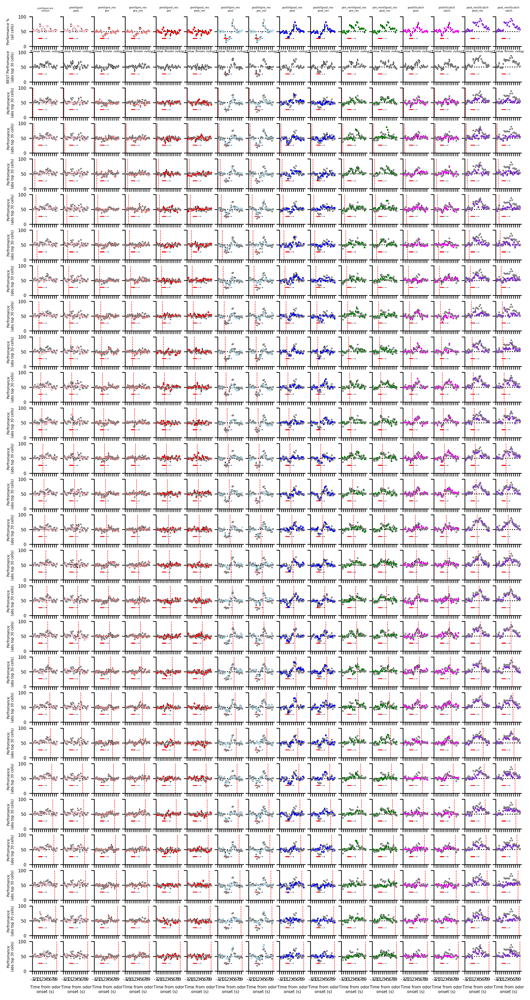

In [39]:
%%time
plot_ref_scores('rwVSsh','top_abs',ylabel='Perfromance\n(abs top 30 cells)',subset_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


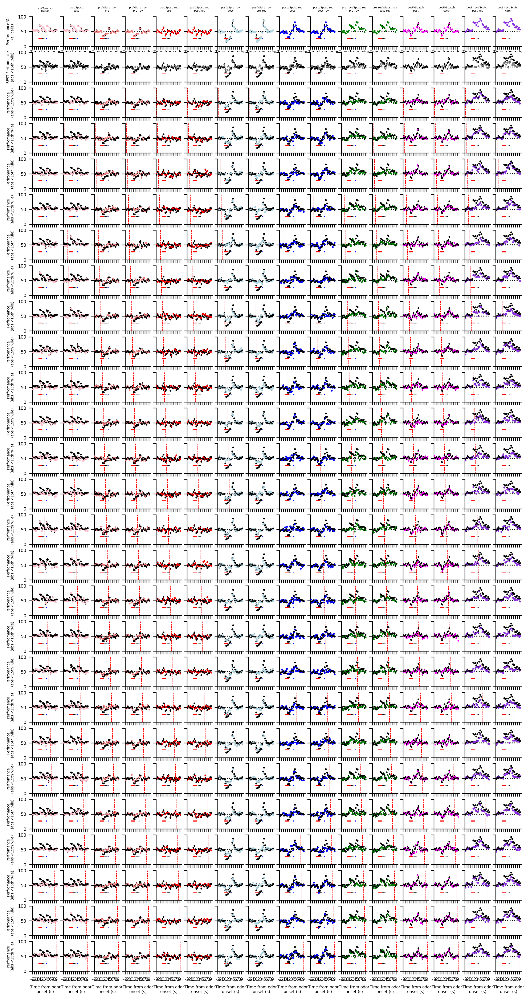

In [40]:
plot_ref_scores('rwVSsh','bottom15_abs',ylabel='Perfromance\n(abs <15th %ile)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


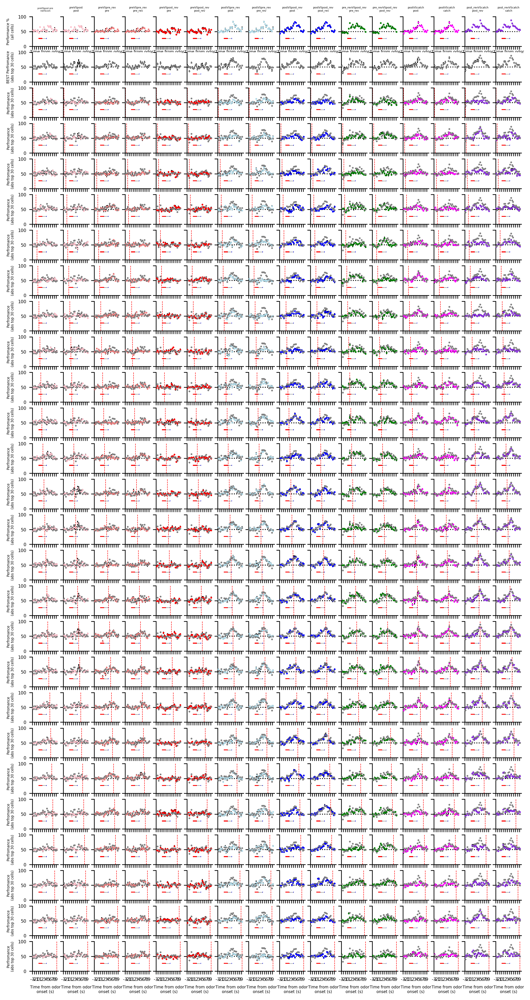

In [41]:
plot_ref_scores('rwVScsm','top_abs',ylabel='Perfromance\n(abs top 30 cells)',subset_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


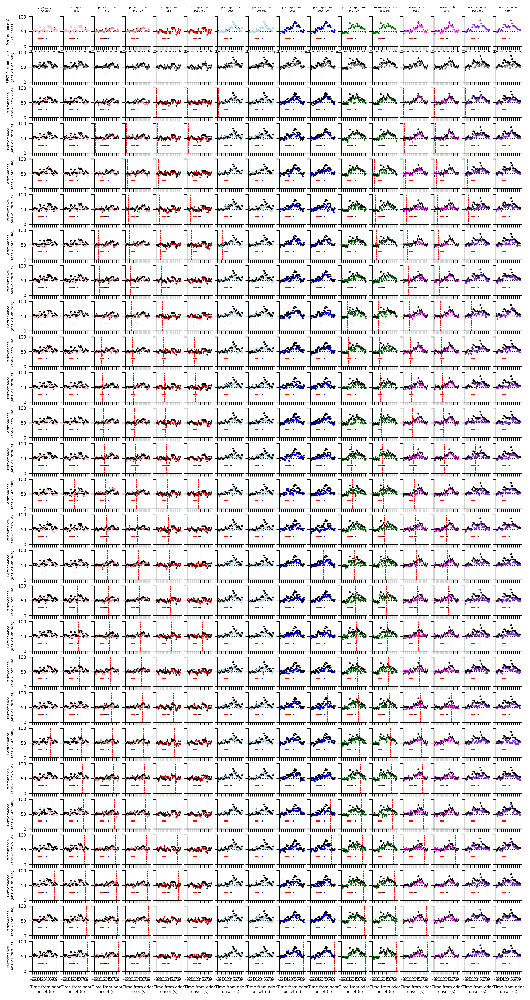

In [42]:
plot_ref_scores('rwVScsm','bottom15_abs',ylabel='Perfromance\n(abs <15th %ile)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


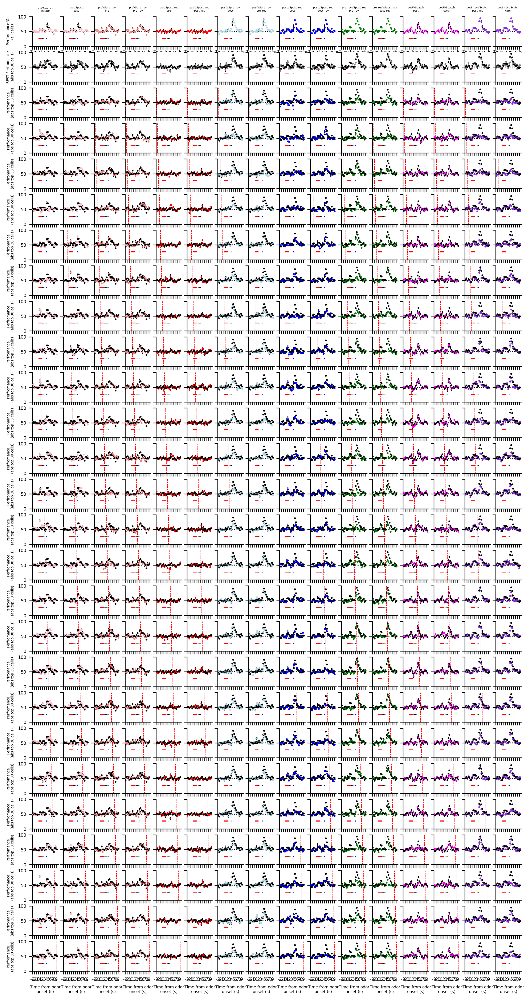

In [43]:
plot_ref_scores('shVScsm','top_abs',ylabel='Perfromance\n(abs top 30 cells)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


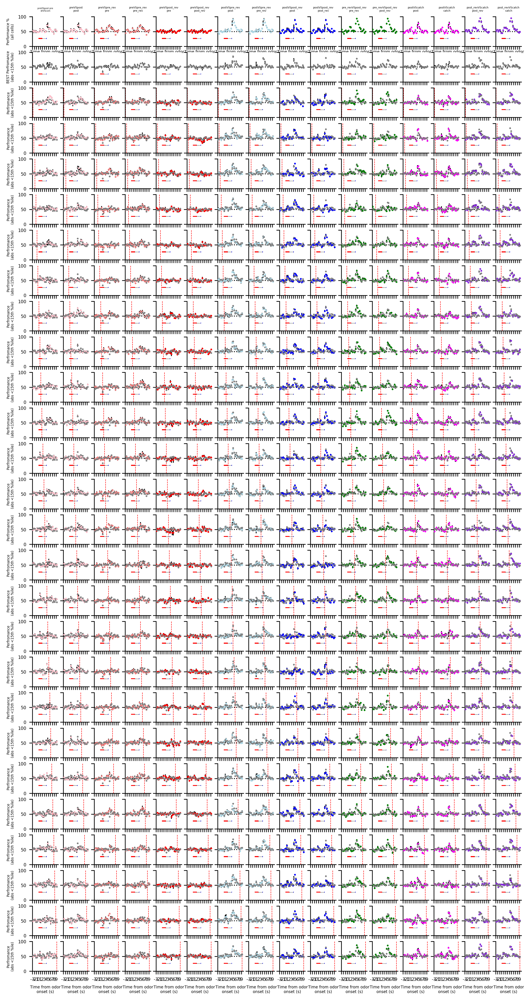

In [44]:
plot_ref_scores('shVScsm','bottom15_abs',ylabel='Perfromance\n(abs <15th %ile)',subset_cells_overlay=True)

In [45]:
save_workspace(db)

Could not store variable 'sstats'. Skipping...
Could not store variable 'IPython'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'di'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'np'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'os'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
